In [1]:
import numpy as np
import pandas as pd
import nipy
from nipy.modalities.fmri import hrf, utils
from pprint import pprint
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.ticker as tkr     # has classes for tick-locating and -formatting
%matplotlib inline

def numfmt(x, pos): # your custom formatter function: divide by 100.0
    s = '{}'.format(x / 10.0)
    return s

### Model BOLD-response using glover
function taken from nipy

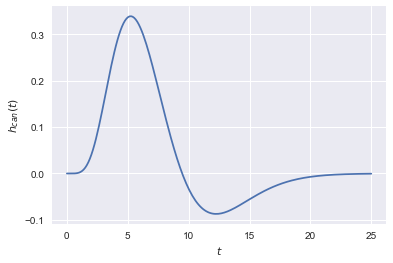

In [2]:
# hrf.glover is a symbolic function; get a function of time to work on arrays
hrf_func = utils.lambdify_t(hrf.glover(utils.T))

# Time array
t = np.linspace(0,25,200)

# plot BOLD as function of time
plt.plot(t, hrf_func(t))
a=plt.gca()
a.set_xlabel(r'$t$')
a.set_ylabel(r'$h_{can}(t)$')

## Function to create EV matrix for a single participant
The EV matrix is of size (n_deciseconds, n_evs). The columns are boxcar functions of the events
The returned matrix X is of size (n_deciseconds, n_evs), and is the EV matrix convolved with the HRF

In [76]:
def stim_to_design(pp_design):
    
    pp_design = pp_design.loc[pp_design['null_trial'] == False,:]

    # hrf.glover is a symbolic function; get a function of time to work on arrays
    hrf_func = utils.lambdify_t(hrf.glover(utils.T))
    
    n_conditions = len(np.unique(pp_design['cue']))
    max_time = np.ceil((pp_design['stimulus_onset_time'].max()+25)*10)

    # 14 types of stimuli
    stim_vec = np.zeros(shape=(int(max_time), 14))
    stim_names = []
    
    # Get stimulus onsets and durations
    i = -1
    for stim_type in pp_design['correct_answer'].unique():
            
        for cue_type in pp_design['cue'].unique():
            i += 1
            stim_names.append('stimulus_' + str(int(stim_type)) + '_' + cue_type)
            stim_onsets = pp_design.loc[(pp_design['correct_answer'] == stim_type) &
                                        (pp_design['cue'] == cue_type), 'stimulus_onset_time']*10
            stim_durations = pp_design['phase_4']*10
            for onset, duration in zip(stim_onsets, stim_durations):
                stim_vec[np.arange(onset, onset+duration, dtype='int'), i] = 1
    
    # Get cue onsets by cue type
    cue_names = []
    cue_vec = np.zeros(shape=(int(max_time), n_conditions))  # A column per cue type condition
    i = -1
    for condition in pp_design['cue'].unique():
        i += 1
        cue_names.append('cue_' + condition)

        # Find cue onsets
        onsets = pp_design.loc[pp_design['cue'] == condition, 'cue_onset_time'].values*10
        durations = pp_design.loc[pp_design['cue'] == condition, 'phase_2'].values*10
        for onset, duration in zip(onsets, durations):
            cue_vec[np.arange(onset, onset+duration, dtype='int'), i] = 1
    
    # Combine everything in a single array
    ev_vec = np.hstack((cue_vec, stim_vec))
    ev_names = cue_names + stim_names
    print(cue_vec.shape[1])
    print(stim_vec.shape[1])
            
    # Create hrf to convolve with
    hrf_full = hrf_func(np.linspace(0, stop=int(max_time/10), num=int(max_time)))

    # Pre-allocate output. This will be an n_timepoints x n_conditions+1 matrix.
    X = np.empty(shape=(int(max_time), ev_vec.shape[1]))

    # Convolve everything: the stimulus first, the cues afterwards.
    for i, ev_name in enumerate(ev_names):
        print('Convolving %s...' % ev_name)
        X[:, i] = np.convolve(hrf_full, ev_vec[:, i])[:int(max_time)]
            
    return X, ev_names

## Function to plot an individual participant's design

In [68]:
def plot_participant_design(pp_design, pp_num):

    X, ev_names = stim_to_design(pp_design)
    n_evs = len(ev_names)

    yfmt = tkr.FuncFormatter(numfmt)    # create custom formatter function (re-format y-axis for seconds instead of 1/10th secs)

    # Plot
    X_plot = X/np.max(X)
    f = plt.figure(figsize=(10, 40))
    for plot in range(n_evs):
        plt.plot(X_plot[:, plot] + plot, np.arange(X.shape[0]))
    
    # Set y-axis
    plt.ylabel('Time (s)')
    plt.ylim((pp_design['cue_onset_time'].min()*10, X.shape[0]))
    ax = plt.gca()
    ax.invert_yaxis()
    ax.yaxis.set_major_formatter(yfmt)
    
    # Set x-axis
    plt.xticks(np.arange(len(ev_names)), ev_names, rotation=70)
    ax.xaxis.tick_top()

    f.set_size_inches(10, 40)
    plt.savefig('pp_%s_design.png' % str(pp_num).zfill(3))

Processing participant 1
1.0
0.0
nan
skipping)
Convolving cue_HAND...
Convolving cue_EYE...
Convolving cue_SPD...
Convolving cue_ACC...
Convolving cue_RIGHT...
Convolving cue_NEU...
Convolving cue_LEFT...
Convolving stimulus_1.0_HAND...
Convolving stimulus_1.0_EYE...
Convolving stimulus_1.0_SPD...
Convolving stimulus_1.0_ACC...
Convolving stimulus_1.0_RIGHT...
Convolving stimulus_1.0_NEU...
Convolving stimulus_1.0_LEFT...
Convolving stimulus_0.0_HAND...
Convolving stimulus_0.0_EYE...
Convolving stimulus_0.0_SPD...
Convolving stimulus_0.0_ACC...
Convolving stimulus_0.0_RIGHT...
Convolving stimulus_0.0_NEU...
Convolving stimulus_0.0_LEFT...
Processing participant 2
0.0
1.0
nan
skipping)
Convolving cue_HAND...
Convolving cue_EYE...
Convolving cue_ACC...
Convolving cue_SPD...
Convolving cue_NEU...
Convolving cue_RIGHT...
Convolving cue_LEFT...
Convolving stimulus_0.0_HAND...
Convolving stimulus_0.0_EYE...
Convolving stimulus_0.0_ACC...
Convolving stimulus_0.0_SPD...
Convolving stimulus_0.0

Convolving stimulus_1.0_HAND...
Convolving stimulus_1.0_EYE...
Convolving stimulus_1.0_LEFT...
Convolving stimulus_1.0_RIGHT...
Convolving stimulus_1.0_NEU...
Convolving stimulus_1.0_ACC...
Convolving stimulus_1.0_SPD...
Processing participant 14
0.0
1.0
nan
skipping)
Convolving cue_HAND...
Convolving cue_EYE...
Convolving cue_NEU...
Convolving cue_LEFT...
Convolving cue_RIGHT...
Convolving cue_SPD...
Convolving cue_ACC...
Convolving stimulus_0.0_HAND...
Convolving stimulus_0.0_EYE...
Convolving stimulus_0.0_NEU...
Convolving stimulus_0.0_LEFT...
Convolving stimulus_0.0_RIGHT...
Convolving stimulus_0.0_SPD...
Convolving stimulus_0.0_ACC...
Convolving stimulus_1.0_HAND...
Convolving stimulus_1.0_EYE...
Convolving stimulus_1.0_NEU...
Convolving stimulus_1.0_LEFT...
Convolving stimulus_1.0_RIGHT...
Convolving stimulus_1.0_SPD...
Convolving stimulus_1.0_ACC...
Processing participant 15
1.0
0.0
nan
skipping)
Convolving cue_HAND...
Convolving cue_EYE...
Convolving cue_LEFT...
Convolving cue_

/Users/steven/anaconda/envs/subcortex/lib/python2.7/site-packages/matplotlib/pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


Processing participant 22
1.0
0.0
nan
skipping)
Convolving cue_HAND...
Convolving cue_EYE...
Convolving cue_RIGHT...
Convolving cue_LEFT...
Convolving cue_NEU...
Convolving cue_SPD...
Convolving cue_ACC...
Convolving stimulus_1.0_HAND...
Convolving stimulus_1.0_EYE...
Convolving stimulus_1.0_RIGHT...
Convolving stimulus_1.0_LEFT...
Convolving stimulus_1.0_NEU...
Convolving stimulus_1.0_SPD...
Convolving stimulus_1.0_ACC...
Convolving stimulus_0.0_HAND...
Convolving stimulus_0.0_EYE...
Convolving stimulus_0.0_RIGHT...
Convolving stimulus_0.0_LEFT...
Convolving stimulus_0.0_NEU...
Convolving stimulus_0.0_SPD...
Convolving stimulus_0.0_ACC...
Processing participant 23
0.0
1.0
nan
skipping)
Convolving cue_HAND...
Convolving cue_EYE...
Convolving cue_NEU...
Convolving cue_RIGHT...
Convolving cue_LEFT...
Convolving cue_ACC...
Convolving cue_SPD...
Convolving stimulus_0.0_HAND...
Convolving stimulus_0.0_EYE...
Convolving stimulus_0.0_NEU...
Convolving stimulus_0.0_RIGHT...
Convolving stimulus

Convolving stimulus_0.0_EYE...
Convolving stimulus_0.0_HAND...
Convolving stimulus_0.0_SPD...
Convolving stimulus_0.0_ACC...
Convolving stimulus_0.0_RIGHT...
Convolving stimulus_0.0_LEFT...
Convolving stimulus_0.0_NEU...
Processing participant 35
1.0
0.0
nan
skipping)
Convolving cue_EYE...
Convolving cue_HAND...
Convolving cue_ACC...
Convolving cue_SPD...
Convolving cue_LEFT...
Convolving cue_NEU...
Convolving cue_RIGHT...
Convolving stimulus_1.0_EYE...
Convolving stimulus_1.0_HAND...
Convolving stimulus_1.0_ACC...
Convolving stimulus_1.0_SPD...
Convolving stimulus_1.0_LEFT...
Convolving stimulus_1.0_NEU...
Convolving stimulus_1.0_RIGHT...
Convolving stimulus_0.0_EYE...
Convolving stimulus_0.0_HAND...
Convolving stimulus_0.0_ACC...
Convolving stimulus_0.0_SPD...
Convolving stimulus_0.0_LEFT...
Convolving stimulus_0.0_NEU...
Convolving stimulus_0.0_RIGHT...
Processing participant 36
0.0
1.0
nan
skipping)
Convolving cue_EYE...
Convolving cue_HAND...
Convolving cue_LEFT...
Convolving cue_

Convolving stimulus_0.0_EYE...
Convolving stimulus_0.0_HAND...
Convolving stimulus_0.0_LEFT...
Convolving stimulus_0.0_RIGHT...
Convolving stimulus_0.0_NEU...
Convolving stimulus_0.0_SPD...
Convolving stimulus_0.0_ACC...
Convolving stimulus_1.0_EYE...
Convolving stimulus_1.0_HAND...
Convolving stimulus_1.0_LEFT...
Convolving stimulus_1.0_RIGHT...
Convolving stimulus_1.0_NEU...
Convolving stimulus_1.0_SPD...
Convolving stimulus_1.0_ACC...
Processing participant 48
1.0
0.0
nan
skipping)
Convolving cue_HAND...
Convolving cue_EYE...
Convolving cue_SPD...
Convolving cue_ACC...
Convolving cue_LEFT...
Convolving cue_RIGHT...
Convolving cue_NEU...
Convolving stimulus_1.0_HAND...
Convolving stimulus_1.0_EYE...
Convolving stimulus_1.0_SPD...
Convolving stimulus_1.0_ACC...
Convolving stimulus_1.0_LEFT...
Convolving stimulus_1.0_RIGHT...
Convolving stimulus_1.0_NEU...
Convolving stimulus_0.0_HAND...
Convolving stimulus_0.0_EYE...
Convolving stimulus_0.0_SPD...
Convolving stimulus_0.0_ACC...
Convol

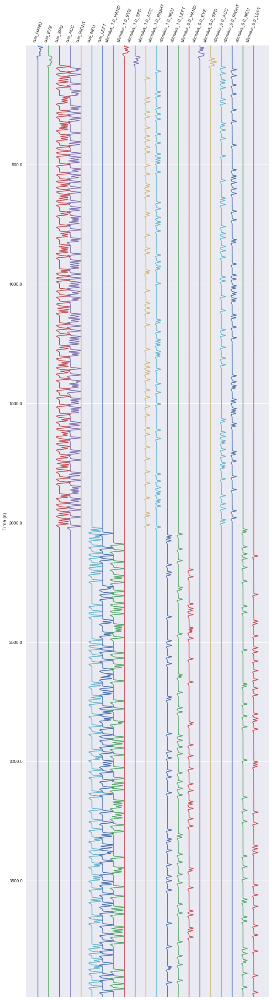

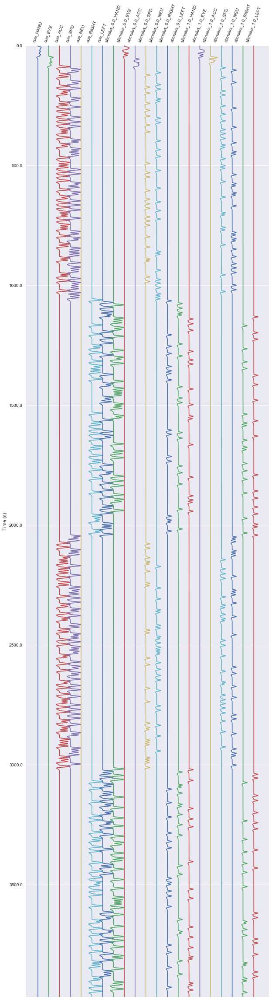

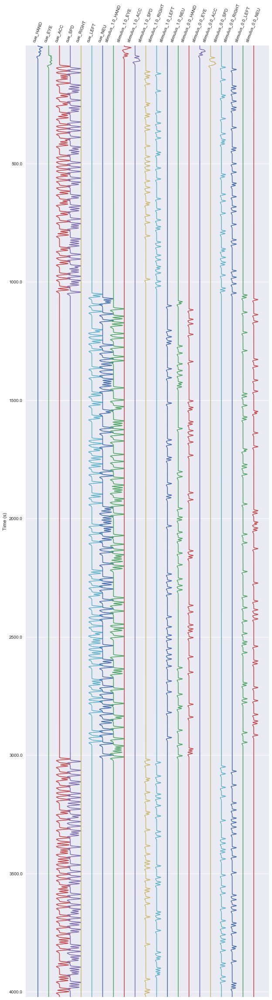

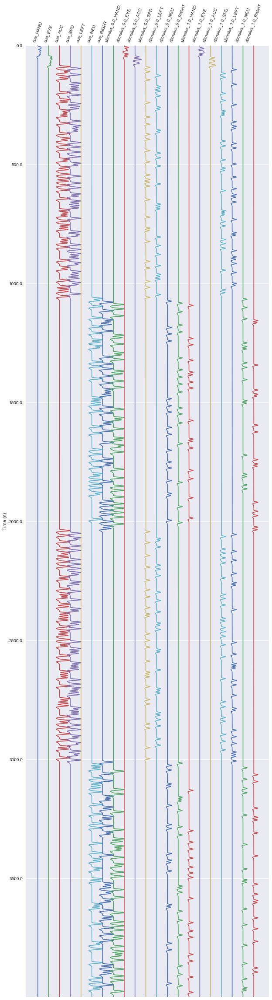

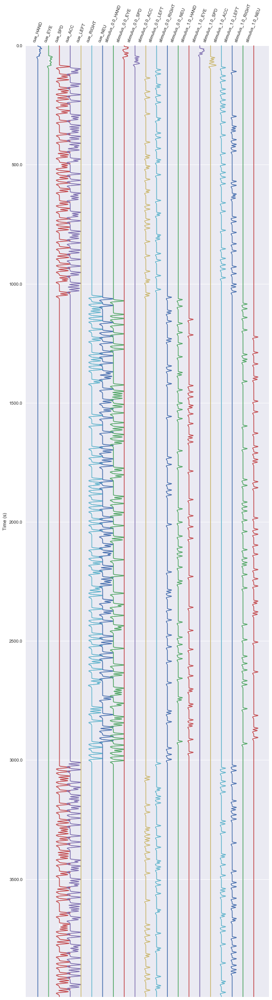

...

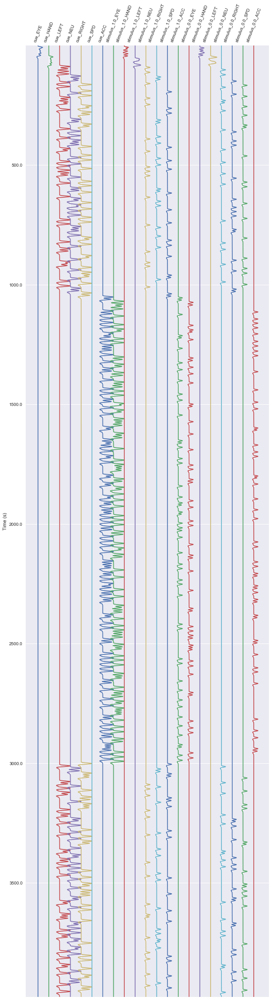

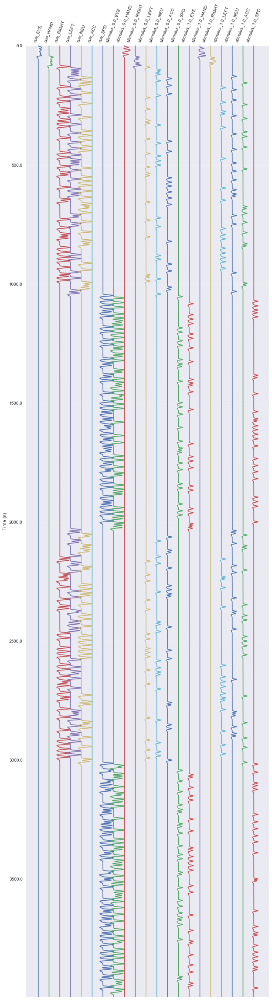

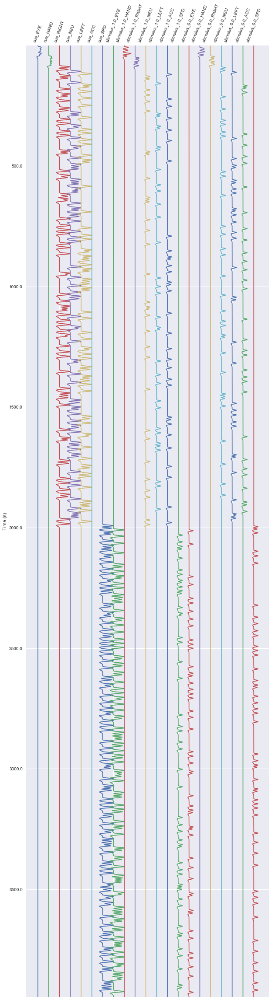

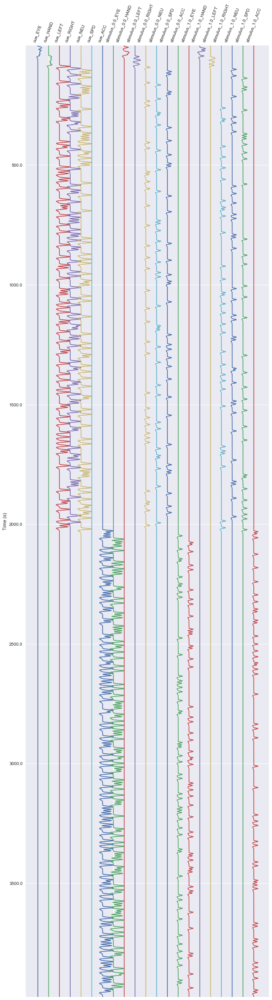

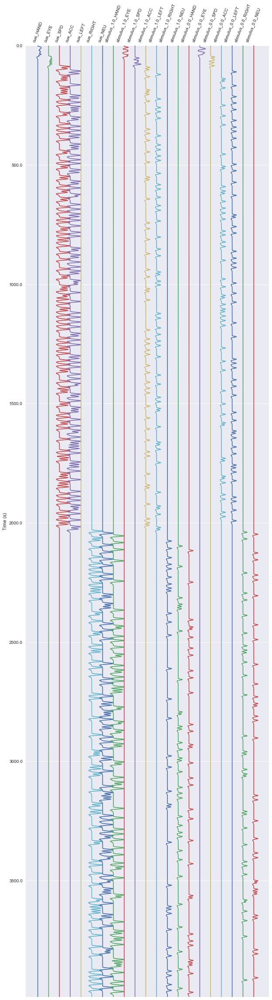

In [42]:
overwrite = True
pps = range(1, 49)

if overwrite:
    for pp in pps:
        print('Processing participant %d' % pp)
        pp_num = str(pp).zfill(3)
        stim_info = pd.read_csv('pp_%s_trial_types_full.csv' % pp_num)
        stim_info = stim_info[['trial_type', 'correct_answer', 'block', 'phase_2', 'phase_4', 'cue', 'cue_onset_time', 'stimulus_onset_time']]

        plot_participant_design(stim_info, pp)

## Evaluating the design matrix
Plot correlation matrix first

In [78]:
# Select pp num and load design
pp_num = 1
pp_num_str = str(1).zfill(3)
pp_design = pd.read_csv('pp_%s_trial_types_full.csv' % pp_num_str) # Load design

# Calculate design matrix
X, ev_names = stim_to_design(pp_design)
print(X.shape)
print(ev_names)
X = np.hstack((np.ones(shape=(X.shape[0], 1)), X))  # Add column of ones to design matrix? for 'event' in general/baseline?

HAND
0.0
EYE
0.0
ACC
0.0
SPD
0.0
LEFT
0.0
RIGHT
0.0
NEU
0.0
HAND
1.0
EYE
1.0
ACC
1.0
SPD
1.0
LEFT
1.0
RIGHT
1.0
NEU
1.0
HAND
EYE
ACC
SPD
LEFT
RIGHT
NEU
7
14
Convolving cue_HAND...
Convolving cue_EYE...
Convolving cue_ACC...
Convolving cue_SPD...
Convolving cue_LEFT...
Convolving cue_RIGHT...
Convolving cue_NEU...
Convolving stimulus_0_HAND...
Convolving stimulus_0_EYE...
Convolving stimulus_0_ACC...
Convolving stimulus_0_SPD...
Convolving stimulus_0_LEFT...
Convolving stimulus_0_RIGHT...
Convolving stimulus_0_NEU...
Convolving stimulus_1_HAND...
Convolving stimulus_1_EYE...
Convolving stimulus_1_ACC...
Convolving stimulus_1_SPD...
Convolving stimulus_1_LEFT...
Convolving stimulus_1_RIGHT...
Convolving stimulus_1_NEU...
(40173, 21)
['cue_HAND', 'cue_EYE', 'cue_ACC', 'cue_SPD', 'cue_LEFT', 'cue_RIGHT', 'cue_NEU', 'stimulus_0_HAND', 'stimulus_0_EYE', 'stimulus_0_ACC', 'stimulus_0_SPD', 'stimulus_0_LEFT', 'stimulus_0_RIGHT', 'stimulus_0_NEU', 'stimulus_1_HAND', 'stimulus_1_EYE', 'stimulus_

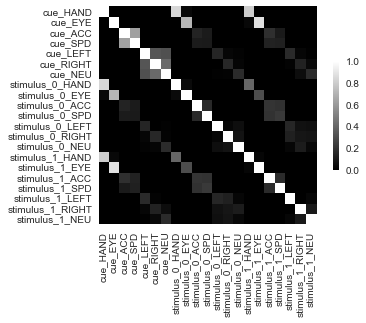

In [79]:
# Calculate correlation matrix
df = pd.DataFrame(X[:,1:], columns=ev_names).corr()
corr = np.abs(df).corr()

# Plot
sns.heatmap(corr, vmax=1, vmin=0, center=.5, cmap='gray',
            square=True, linewidths=0.00, cbar_kws={"shrink": .5})

## Calculate efficiency